# Notebook for final layer creation for upload to ArcGis Pro

In [2]:
import pandas as pd
import pathlib
import matplotlib.pyplot as plt
import numpy as np
import geopandas as gpd
import contextily as cx
import requests

### Path to output and data directories

In [3]:
PATH = pathlib.Path().resolve()
DATA = PATH / 'data'
OUTPUT = PATH / 'output'

### Thurson County Parcel layer

Source: https://gisdata-thurston.opendata.arcgis.com/

<Axes: >

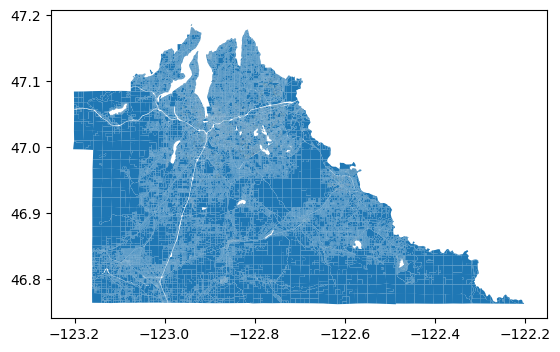

In [4]:
thur_pcls = gpd.read_file(DATA / 'Thurston_Parcels.geojson')

#General plot of parcels
thur_pcls.plot()

In [18]:
thur_pcls.head()

,OBJECTID,PARCEL_NO,ADDRESS1,ADDRESS2,CITY,STATE,ZIP,COUNTRY,SITUS_STRE,SITUS_CITY,...,EFF_YR_BUI,RES_QUAL,RES_COND,REC_VOLPAG,PARENT,MapSource,GlobalID,SHAPE_Length,SHAPE_Area,geometry
0,1,09010001000,3334 FRIENDLY GROVE RD NE,None,OLYMPIA,WA,98506,UNITED STATES,3303 LIBBY RD NE,OLYMPIA,...,1995,F,AV,3471585,None,Parcel Fabric,{EF683F2C-57D9-4842-8105-8114832D5CE9},0.005028,1.508650e-06,"MULTIPOLYGON (((-122.86508 47.07997, -122.8650..."
1,2,09010001001,3307 LIBBY RD NE,None,OLYMPIA,WA,98506-2986,None,3307 LIBBY RD NE,OLYMPIA,...,1994,A,GD,3960604,None,Parcel Fabric,{F8C4223B-181D-4071-B870-6837463C0BD7},0.005597,1.942365e-06,"MULTIPOLYGON (((-122.86577 47.08125, -122.8650..."
2,3,09010002000,3300 FRIENDLY GROVE RD NE,None,OLYMPIA,WA,98506,UNITED STATES,3300 FRIENDLY GROVE RD NE,OLYMPIA,...,1989,A,AV,None,None,Parcel Fabric,{B585A28E-B9F6-424D-AF44-05A5595FF42E},0.003420,5.469418e-07,"MULTIPOLYGON (((-122.87 47.07903, -122.87 47.0..."
3,4,09010003000,641 CALISTOGA ST SE,None,OLYMPIA,WA,98513,None,3233 TO 3235 LIBBY RD NE,OLYMPIA,...,1989,F+,GD,4636527,None,Parcel Fabric,{79731EE4-7C0B-4C9E-83E4-CD6A1140F245},0.007406,2.118703e-06,"MULTIPOLYGON (((-122.86661 47.07899, -122.8650..."
4,5,09010005000,2220 TOM EVANS RD NE,None,OLYMPIA,WA,98506,UNITED STATES,2220 TOM EVANS RD NE,OLYMPIA,...,None,None,None,3662170,None,Parcel Fabric,{B345F975-D927-4147-BAFD-3DC9D90A21CC},0.001696,1.767750e-07,"MULTIPOLYGON (((-122.86912 47.0787, -122.86912..."


### Census Block Geometries

Source: data.census.gov

In [5]:
blocks = gpd.read_file(DATA / 'wa_census_blocks/wa_blocks.shp')

# Check census block crs
blocks.crs

<Geographic 2D CRS: EPSG:4269>
Name: NAD83
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: North America - onshore and offshore: Canada - Alberta; British Columbia; Manitoba; New Brunswick; Newfoundland and Labrador; Northwest Territories; Nova Scotia; Nunavut; Ontario; Prince Edward Island; Quebec; Saskatchewan; Yukon. Puerto Rico. United States (USA) - Alabama; Alaska; Arizona; Arkansas; California; Colorado; Connecticut; Delaware; Florida; Georgia; Hawaii; Idaho; Illinois; Indiana; Iowa; Kansas; Kentucky; Louisiana; Maine; Maryland; Massachusetts; Michigan; Minnesota; Mississippi; Missouri; Montana; Nebraska; Nevada; New Hampshire; New Jersey; New Mexico; New York; North Carolina; North Dakota; Ohio; Oklahoma; Oregon; Pennsylvania; Rhode Island; South Carolina; South Dakota; Tennessee; Texas; Utah; Vermont; Virginia; Washington; West Virginia; Wisconsin; Wyoming. US Virgin Islands. British Virgin Islands

### Internet speed surveys, combined into single layer

gis_package folder contains functions for retrieving geojson and json files from ArcGIS Rest server urls

### SBO Speed Test and Ookla Speed Test from 2022 Both from statewide broadband map

In [6]:
import importlib
from gis_package import download_layer
importlib.reload(download_layer)

urls = [
    'https://services8.arcgis.com/M6FVSymJ2XsnL91N/arcgis/rest/services/StatewideMapPublicFiles/FeatureServer/1/query',
    'https://services8.arcgis.com/M6FVSymJ2XsnL91N/arcgis/rest/services/StatewideMapPublicFiles/FeatureServer/5/query'
]

sources = ['SBOSpeedTest', 'OoklaSpeedTest2022']

speed_test_start = download_layer.combine_layer(urls, source_names=sources)


Downloaded 1000 features from https://services8.arcgis.com/M6FVSymJ2XsnL91N/arcgis/rest/services/StatewideMapPublicFiles/FeatureServer/1/query...
Downloaded 2000 features from https://services8.arcgis.com/M6FVSymJ2XsnL91N/arcgis/rest/services/StatewideMapPublicFiles/FeatureServer/1/query...
Downloaded 3000 features from https://services8.arcgis.com/M6FVSymJ2XsnL91N/arcgis/rest/services/StatewideMapPublicFiles/FeatureServer/1/query...
Downloaded 4000 features from https://services8.arcgis.com/M6FVSymJ2XsnL91N/arcgis/rest/services/StatewideMapPublicFiles/FeatureServer/1/query...
Downloaded 5000 features from https://services8.arcgis.com/M6FVSymJ2XsnL91N/arcgis/rest/services/StatewideMapPublicFiles/FeatureServer/1/query...
Downloaded 6000 features from https://services8.arcgis.com/M6FVSymJ2XsnL91N/arcgis/rest/services/StatewideMapPublicFiles/FeatureServer/1/query...
Downloaded 7000 features from https://services8.arcgis.com/M6FVSymJ2XsnL91N/arcgis/rest/services/StatewideMapPublicFiles/Fea

<Axes: >

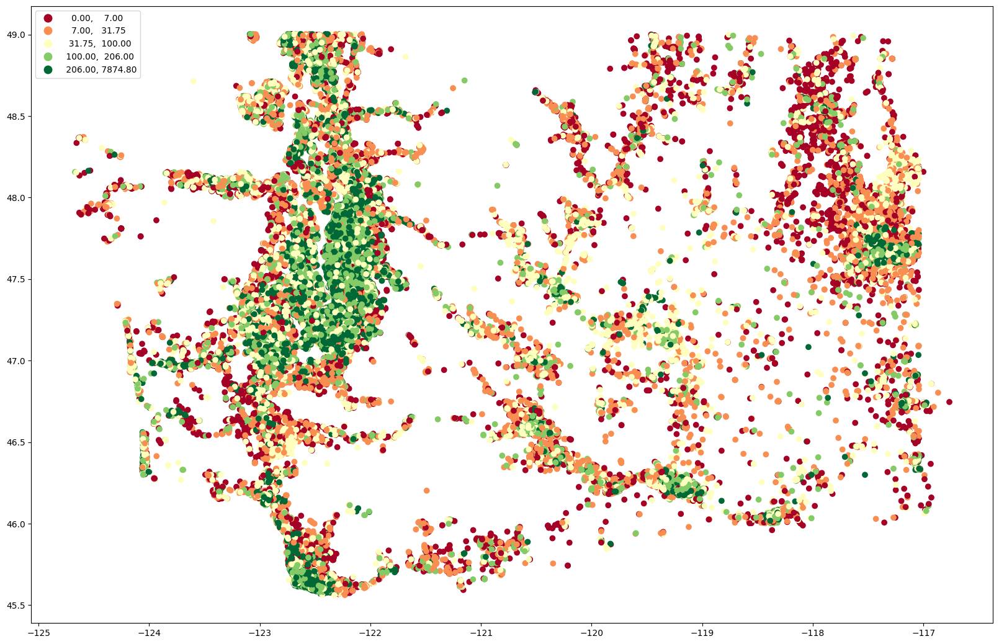

In [7]:
# These geojson are captured with the Geographic crs 4326
# But it isn't recognized in this notebook so it's necessary
# to assign the coordinates, overriding the default.
speed_test_start = speed_test_start.set_crs(4326, allow_override=True)

#Quick plot of the two surveys together
speed_test_start.plot(figsize=(20,20), column='download', cmap='RdYlGn', legend=True, scheme='quantiles')

In [8]:
# Drop unwated colums from gdf
speed_test_start = speed_test_start.drop(['jitter', 'Reconnect', 'cost', 'wouldpay', 'township', 'tests', 'devices'], axis=1)

### Append large, 112,000 speed test dataset to geojson
### Ookla 2019-2023

Due to size can only be downloaded as json and then assigned as a GeoDataFrame

In [9]:
from gis_package import json
url = 'https://services6.arcgis.com/tboeqGwETr5ppr5Q/arcgis/rest/services/Ookla_Fixed_Tiles_WA_Q1_2019_Q1_2023/FeatureServer/50/query'
ookla = json.download_feature_layer(url, 2000)
ookla

Downloaded 2000 features...
Downloaded 4000 features...
Downloaded 6000 features...
Downloaded 8000 features...
Downloaded 10000 features...
Downloaded 12000 features...
Downloaded 14000 features...
Downloaded 16000 features...
Downloaded 18000 features...
Downloaded 20000 features...
Downloaded 22000 features...
Downloaded 24000 features...
Downloaded 26000 features...
Downloaded 28000 features...
Downloaded 30000 features...
Downloaded 32000 features...
Downloaded 34000 features...
Downloaded 36000 features...
Downloaded 38000 features...
Downloaded 40000 features...
Downloaded 42000 features...
Downloaded 44000 features...
Downloaded 46000 features...
Downloaded 48000 features...
Downloaded 50000 features...
Downloaded 52000 features...
Downloaded 54000 features...
Downloaded 56000 features...
Downloaded 58000 features...
Downloaded 60000 features...
Downloaded 62000 features...
Downloaded 64000 features...
Downloaded 66000 features...
Downloaded 68000 features...
Downloaded 70000 f

,geometry,OBJECTID,QuadKey,CalYear,CalQuarter,Service_Level,Speed_Categories,DL_Speed_Categories,AvgDown,AvgUp,AvgLat,Tests,Devices,Shape__Area,Shape__Length
0,"POLYGON ((-117.35046 47.95682, -117.35595 47.9...",1,0212310210003100,2022,2,Unserved,Unserved,Unserved,2.141,3.154,711,1,1,373321.000000,2444.0
1,"POLYGON ((-117.25708 47.78364, -117.26257 47.7...",2,0212310210231323,2023,2,Unserved,Unserved,Unserved,7.769,4.510,17,2,2,373932.000000,2446.0
2,"POLYGON ((-122.57446 48.91167, -122.57446 48.9...",3,0212300011010130,2023,1,Served,Below State 2028 Goals,At or Above State 2028 Goals,369.438,23.744,15,2,1,373932.000000,2446.0
3,"POLYGON ((-123.01391 47.20464, -123.01941 47.2...",4,0212300232020123,2023,1,Underserved,Underserved,Below State 2028 Goals,100.752,9.555,16,1,1,374544.000000,2448.0
4,"POLYGON ((-122.83814 47.32393, -122.84363 47.3...",5,0212300230320123,2023,1,Served,Below State 2028 Goals,At or Above State 2028 Goals,181.832,35.058,13,1,1,373321.000000,2444.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113137,"POLYGON ((-122.73926 47.05141, -122.74475 47.0...",113138,0212300232332311,2023,2,Underserved,Underserved,Underserved,70.732,22.350,17,2,1,373320.984375,2444.0
113138,"POLYGON ((-122.14051 47.82791, -122.146 47.827...",113139,0212300300302122,2023,2,Underserved,Underserved,At or Above State 2028 Goals,225.340,5.698,23,55,4,373932.000000,2446.0
113139,"POLYGON ((-122.18994 47.20091, -122.18994 47.1...",113140,0212300322031213,2023,2,Underserved,Underserved,At or Above State 2028 Goals,362.888,17.941,16,2,2,374544.000000,2448.0
113140,"POLYGON ((-123.31604 48.05605, -123.32153 48.0...",113141,0212300023203312,2023,2,Unserved,Unserved,Unserved,17.907,1.002,23,1,1,373932.000000,2446.0


Set crs on large Ookla gdf, normalize columns to match the speed_test gdf and combine into one total gdf.

<Axes: >

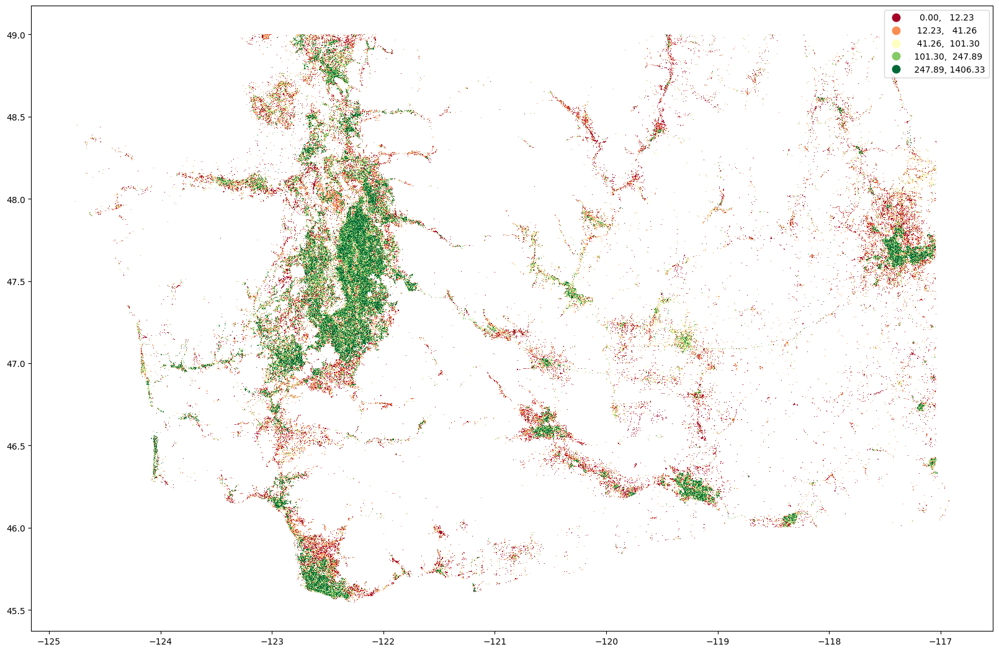

In [10]:
# Set crs and normalize
ookla.set_crs(3857, allow_override=True)
ookla_norm = download_layer.normalize_columns(ookla)

# Combine all layers
speed_test = gpd.GeoDataFrame(pd.concat([speed_test_start, ookla_norm], ignore_index=True), geometry='geometry')
#quick plot of just ookla 2019-2023 
ookla_norm.plot(figsize=(20,20), column='download', cmap='RdYlGn', legend=True, scheme='quantiles')

In [11]:
# Drop unwanted columns after concat and 
# fill source column is ookla 2019-2023
speed_test = speed_test.drop(['FID', 'OBJECTID', 'QuadKey', 'CalYear', 'CalQuarter', 'Service_Level', 'DL_Speed_Categories', 'Tests', 'Devices', 'Shape__Area', 'Shape__Length'], axis=1)
speed_test = speed_test.fillna({'source':'ookla2019_2023'})
speed_test

,geometry,download,upload,latency,speed_tier,provider,source
0,POINT (-122.647 47.7363),0.000,0.000,0,Below 25/3,no service,SBOSpeedTest
1,POINT (-122.9 47.3974),103.500,6.500,0,25/3,Wave,SBOSpeedTest
2,POINT (-122.863 47.3128),0.000,0.000,0,Below 25/3,no service,SBOSpeedTest
3,POINT (-122.839 47.3942),64.200,5.600,0,25/3,Wave,SBOSpeedTest
4,POINT (-122.642 47.5317),0.400,0.600,0,Below 25/3,CenturyLink,SBOSpeedTest
...,...,...,...,...,...,...,...
182253,"POLYGON ((-122.73926 47.05141, -122.74475 47.0...",70.732,22.350,17,Underserved,None,ookla2019_2023
182254,"POLYGON ((-122.14051 47.82791, -122.146 47.827...",225.340,5.698,23,Underserved,None,ookla2019_2023
182255,"POLYGON ((-122.18994 47.20091, -122.18994 47.1...",362.888,17.941,16,Underserved,None,ookla2019_2023
182256,"POLYGON ((-123.31604 48.05605, -123.32153 48.0...",17.907,1.002,23,Unserved,None,ookla2019_2023


### Export speed test layer

In [12]:
speed_test.to_file(OUTPUT / 'speed_test_WA.gpkg')

## Join speed test layer to Thurston County parcels

<Axes: >

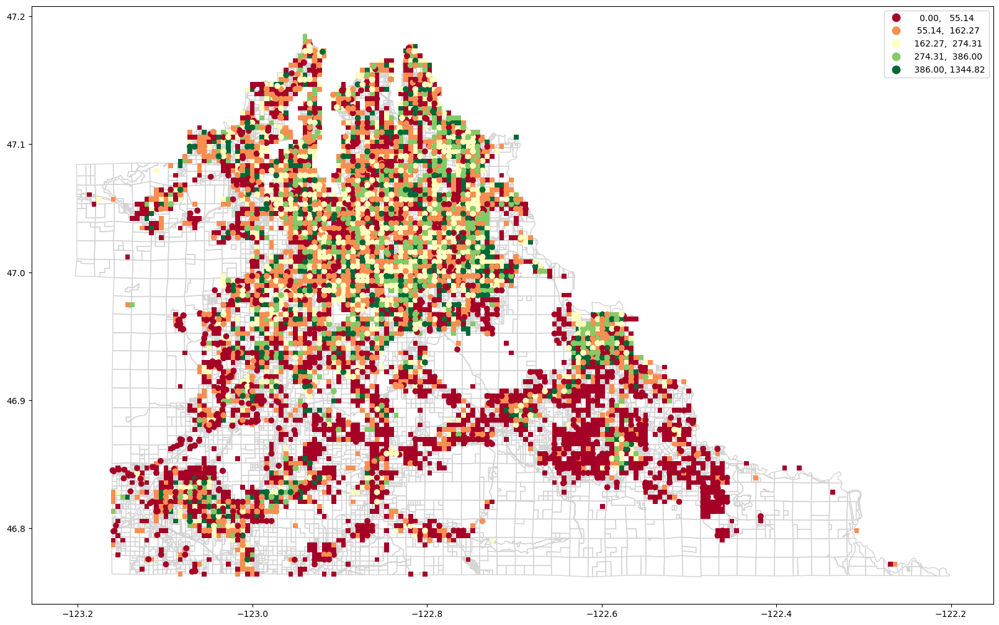

In [32]:
# Convert speed points to NAD83 CRS
speed_test = speed_test.to_crs(thur_pcls.crs)
# spatial join using to view speed datapoints in Thurston County
thurs_speed_point = gpd.sjoin(speed_test, thur_pcls, predicate='intersects')
# Quick plot with parcels layer under points
base = thurs_speed_point.plot(figsize=(20,20), column='download', cmap='RdYlGn', legend=True, scheme='quantiles', zorder=2)
thur_pcls.plot(ax=base, zorder=1, color='None', edgecolor='lightgrey')

In [33]:
# Export as gpkg
thurs_speed_point.to_file(OUTPUT / 'Thurston_Speed_Points.gpkg')

### Layer containing parcels with aggragated speed points - spatial joint

<Axes: >

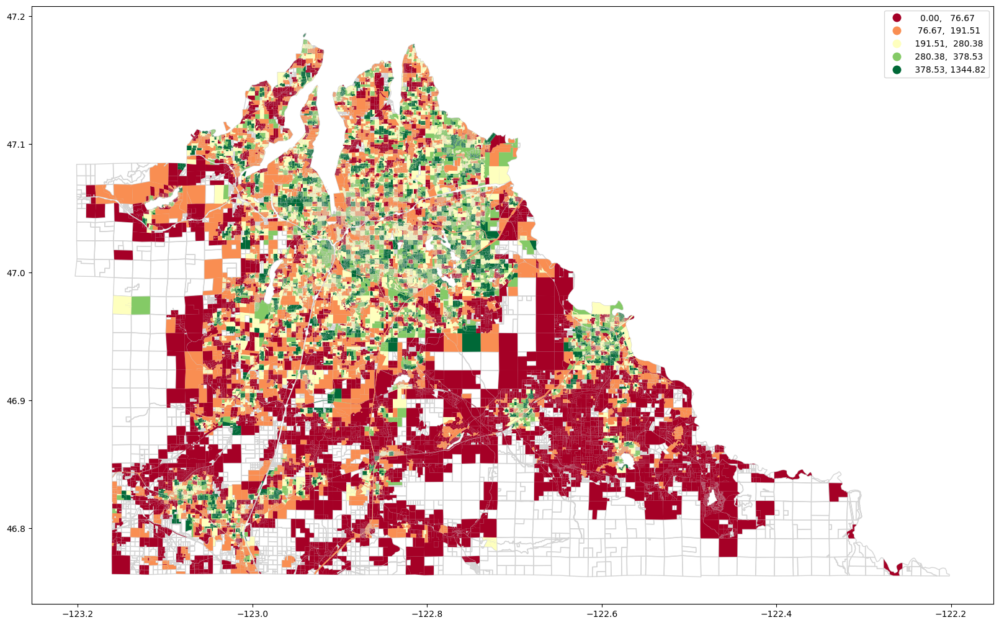

In [34]:
# Aggregate speed points per parcel for ensuing join
parcel_2_join = thurs_speed_point.groupby('PARCEL_NO').agg(
    mean_download = ('download', 'mean'),
    mean_upload = ('upload', 'mean'),
    mean_latency = ('latency', 'mean'),
    most_common_tier=('speed_tier', lambda x: x.mode().iat[0] if not x.mode().empty else None),
    most_common_provider = ('provider', lambda x: x.mode().iat[0] if not x.mode().empty else None)
).reset_index()

# Round average download, upload, and latency to two decimals
parcel_2_join = parcel_2_join.round({'mean_download': 2, 'mean_upload': 2, 'mean_latency': 2})

# join with parcels on left of speed points
# maintaining parcel geometry
thurs_speed = pd.merge(thur_pcls, parcel_2_join, on='PARCEL_NO')

# Quick plot
base = thurs_speed.plot(figsize=(20,20), column='mean_download', cmap='RdYlGn', legend=True, scheme='quantiles', zorder=2)
thur_pcls.plot(ax=base, zorder=1, color='None', edgecolor='lightgrey')

In [35]:
# Export to gpkg
thurs_speed.to_file(OUTPUT / 'Thurston_Parcels_Speed.gpkg')

<Axes: >

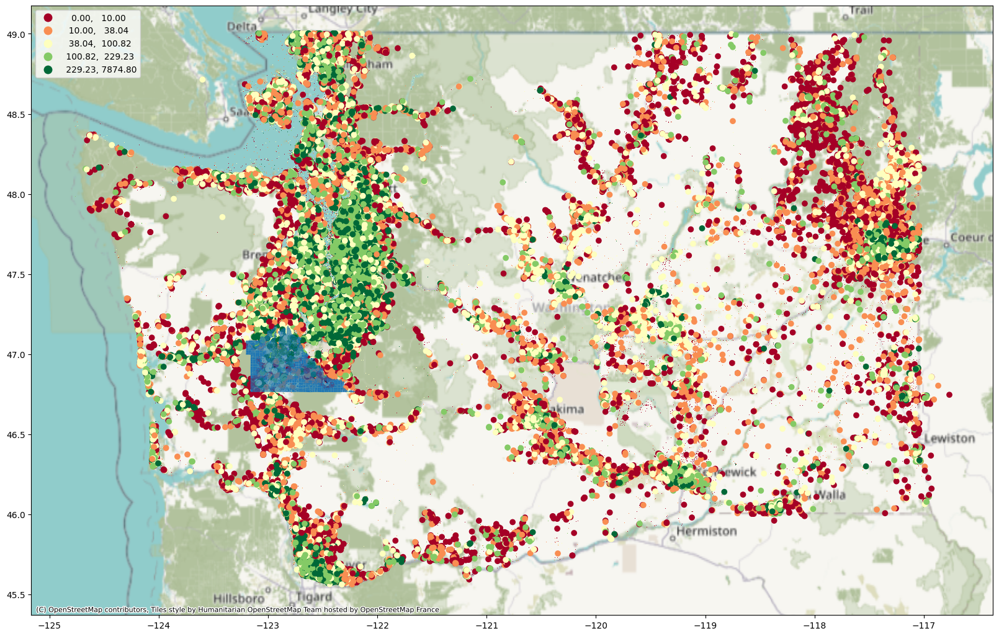

In [36]:
# Quick plot of entire dataset over WA
base = speed_test.plot(figsize=(20,20), column='download', cmap='RdYlGn', legend=True, scheme='quantiles')
cx.add_basemap(base, crs=speed_test.crs)
thur_pcls.plot(ax=base)

## Join speed test points with census blocks

In [37]:
# First standardize crs
speed_test_blockCRS = speed_test.to_crs(blocks.crs)

# Then conduct spatial join maintaining
# speed test geometry for purpose of aggregation
speed_blocks = gpd.sjoin(speed_test_blockCRS, blocks, predicate='intersects')
speed_blocks

,geometry,download,upload,latency,speed_tier,provider,source,index_right,STATEFP20,COUNTYFP20,...,MTFCC20,UR20,UACE20,FUNCSTAT20,ALAND20,AWATER20,INTPTLAT20,INTPTLON20,HOUSING20,POP20
0,POINT (-122.647 47.7363),0.000,0.000,0,Below 25/3,no service,SBOSpeedTest,48435,53,035,...,G5040,U,09946,S,60536,0,+47.7371091,-122.6478658,25,204
1,POINT (-122.9 47.3974),103.500,6.500,0,25/3,Wave,SBOSpeedTest,121071,53,045,...,G5040,R,None,S,0,3148152,+47.4120468,-122.8855810,0,0
2,POINT (-122.863 47.3128),0.000,0.000,0,Below 25/3,no service,SBOSpeedTest,144447,53,045,...,G5040,R,None,S,1363462,0,+47.3139864,-122.8540822,93,141
3,POINT (-122.839 47.3942),64.200,5.600,0,25/3,Wave,SBOSpeedTest,106189,53,045,...,G5040,R,None,S,680676,0,+47.3939263,-122.8486168,154,313
4,POINT (-122.642 47.5317),0.400,0.600,0,Below 25/3,CenturyLink,SBOSpeedTest,64999,53,035,...,G5040,U,09946,S,203621,0,+47.5301517,-122.6438486,84,173
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
182257,"POLYGON ((-122.20642 47.85372, -122.21191 47.8...",72.983,20.454,16,Underserved,None,ookla2019_2023,54964,53,061,...,G5040,U,80389,S,277931,0,+47.8528285,-122.2056628,198,417
182257,"POLYGON ((-122.20642 47.85372, -122.21191 47.8...",72.983,20.454,16,Underserved,None,ookla2019_2023,39231,53,061,...,G5040,U,80389,S,134330,0,+47.8570579,-122.2069002,260,407
182257,"POLYGON ((-122.20642 47.85372, -122.21191 47.8...",72.983,20.454,16,Underserved,None,ookla2019_2023,54474,53,061,...,G5040,U,80389,S,80227,0,+47.8539338,-122.2092622,134,191
182257,"POLYGON ((-122.20642 47.85372, -122.21191 47.8...",72.983,20.454,16,Underserved,None,ookla2019_2023,45668,53,061,...,G5040,U,80389,S,168219,0,+47.8556510,-122.2105177,0,0


In [38]:
# Aggregate (groupby) speed points into census blocks
# Averaging Download and Upload columns and
# assocaiting with most common value in speed tier and provider
block_2_join = speed_blocks.groupby('GEOID20').agg(
    mean_download = ('download', 'mean'),
    mean_upload = ('upload', 'mean'),
    most_common_tier=('speed_tier', lambda x: x.mode().iat[0] if not x.mode().empty else None),
    most_common_provider = ('provider', lambda x: x.mode().iat[0] if not x.mode().empty else None)
).reset_index()
# Round average download and upload to two decimals
block_2_join = block_2_join.round({'mean_download': 2, 'mean_upload': 2})
block_2_join

,GEOID20,mean_download,mean_upload,most_common_tier,most_common_provider
0,530019501001000,10.43,2.56,Unserved,None
1,530019501001004,13.98,5.82,Unserved,None
2,530019501001007,20.75,3.62,Unserved,None
3,530019501001011,47.91,7.78,Underserved,None
4,530019501001013,93.05,2.60,Underserved,None
...,...,...,...,...,...
140263,530779400081037,110.31,17.61,Underserved,None
140264,530779400081038,220.50,9.86,Underserved,None
140265,530779400081039,118.13,12.60,Underserved,None
140266,530779400081040,135.72,7.01,Underserved,Charter Communications


<Axes: >

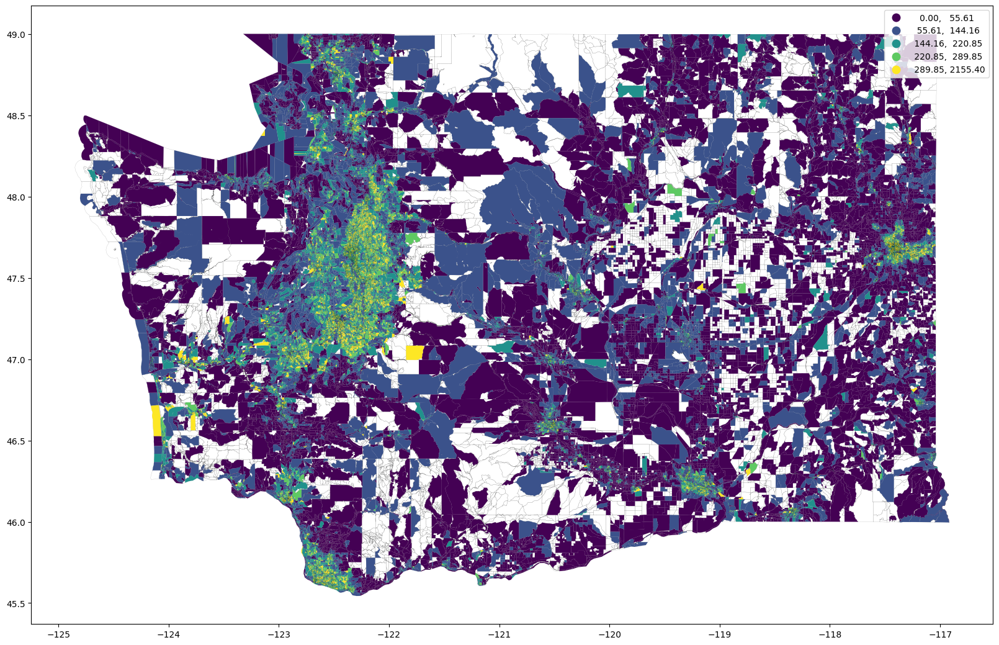

In [39]:
# Join aggragated speed data to census block geometries
block_speeds = pd.merge(blocks, block_2_join, on='GEOID20')

# Quick plot
base = block_speeds.plot(column='mean_download', legend=True, scheme='quantiles', figsize=(20,20), zorder=2)
blocks.plot(ax=base, color='none', edgecolor='black', linewidth=0.1, alpha=0.6, zorder=1)

<Axes: >

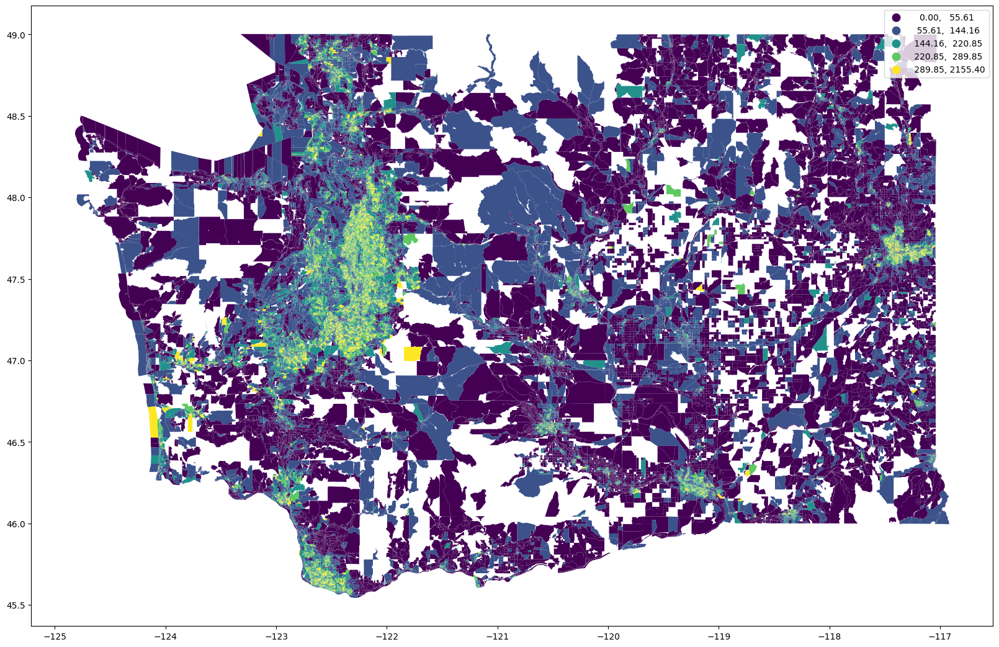

In [40]:
# Plot without census block boundaries
block_speeds.plot(column='mean_download', legend=True, scheme='quantiles', figsize=(20,20))

In [41]:
# Export block speeds to gpkg
block_speeds.to_file(OUTPUT / 'census_block_speed.gpkg')

### Spatial join providing speed data on census blocks in Thurston County

In [42]:
# Standardize crs between both layers
block_join_crs = block_speeds.to_crs(thur_pcls.crs)
all_block_crs = blocks.to_crs(thur_pcls.crs)
# Spatial join of both speed test census block and total census blocks
thurston_block_speed = gpd.sjoin(block_join_crs, thur_pcls, predicate='intersects')
thurston_blocks_all = gpd.sjoin(all_block_crs, thur_pcls, predicate='intersects')

<Axes: >

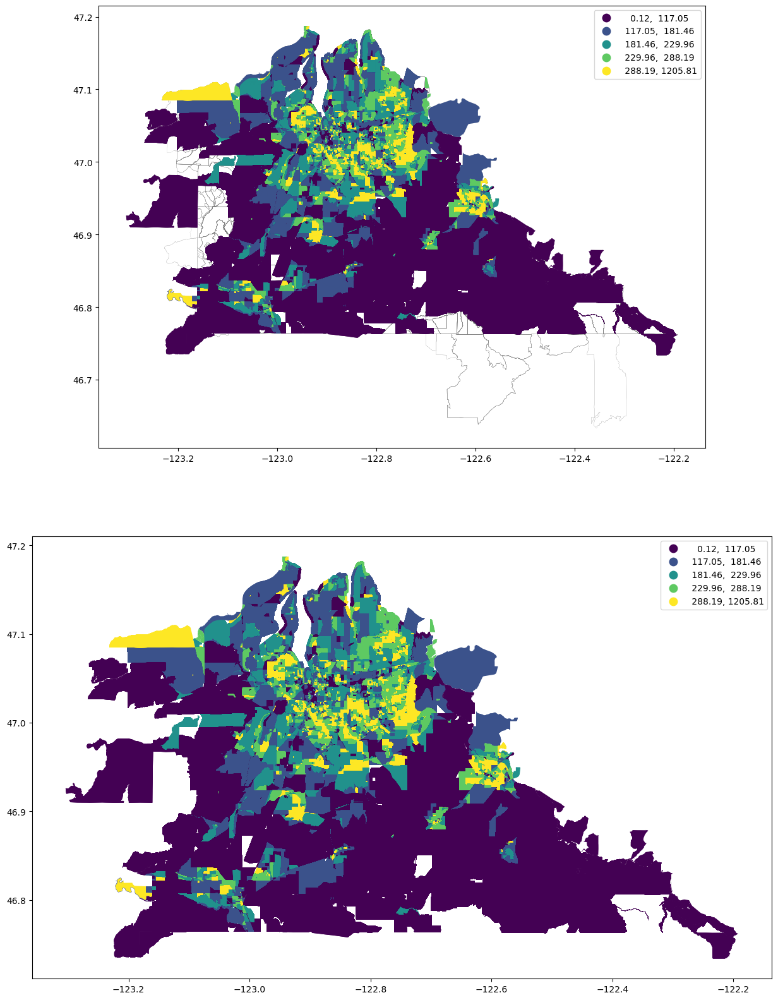

In [43]:
# Quick plot
fix, ax = plt.subplots(2, 1, figsize=(20,20))

thurston_block_speed.plot(ax=ax[0], column='mean_download', scheme='quantiles', legend=True, zorder=2)
thurston_blocks_all.plot(ax=ax[0], color='none', edgecolor='grey', linewidth=0.1, zorder=1)

thurston_block_speed.plot(ax=ax[1], column='mean_download', scheme='quantiles', legend=True)

In [44]:
# Export layers to gpkg
thurston_block_speed.to_file(OUTPUT / 'Thurston_Block_Speed.gpkg')
thurston_blocks_all.to_file(OUTPUT / 'thurston_census_blocks.gpkg')

### Attempt to creat layer of WSDOT 'Dig Once' locations

Source: https://data.wsdot.wa.gov/arcgis/rest/services/Shared/WSDOTProjectDeliveryPlanCurrent/FeatureServer

In [45]:
# Retrieve json - gdf from project Delivery Plan Current WSDOT 
# Using predefined function in gis_package folder
url = 'https://data.wsdot.wa.gov/arcgis/rest/services/Shared/WSDOTProjectDeliveryPlanCurrent/FeatureServer/0/query'
WSDOT = json.download_feature_layer(url, 1000)
WSDOT

Downloaded 1000 features...
Downloaded 1582 features...
Finished downloading 1582 features


,geometry,ObjectId,ProjectNumber,ProjectTitle,WorkDescription,BookDescription,LastUpdated,CPMSRegionCode,RegionDesc,CountyName,...,EndStateRouteMilePost,MiddleStateRouteMilePost,BeginAccumulatedRouteMile,EndAccumulatedRouteMile,MiddleAccumulatedRouteMile,InventoryDirection,ARMCalcResponseDate,Longitude,Latitude,Shape__Length
0,"MULTILINESTRING ((-117.62051 48.06008, -117.62...",1,629200U,SR 292/Springdale to Loon Lake - Chip Seal,Chip Seal,The existing pavement is deteriorating due to ...,1361347200000,ER,Eastern,Stevens,...,5.910000,2.960000,0.000000,5.910000,2.960000,B,1704009600000,-117.681362,48.063846,31347.718702
1,"MULTILINESTRING ((-122.32428 47.45111, -122.32...",2,150907G,SR 509/28th/24th Ave S to S 188th St - SR 509 ...,Widening and Toll Lanes,This project will widen SR 509 between 24th/28...,1523430000000,GWP,Gateway Projects,King,...,24.200001,22.850000,25.240000,29.000000,27.120001,B,1704009600000,-122.333930,47.446034,24652.337636
2,"MULTILINESTRING ((-117.57752 47.58006, -117.57...",3,609047C,I-90/Medical Lake I/C to Geiger Field I/C - Re...,Design and rebuild I/C for Exit 272.,Increasing private and commercial development ...,1361347200000,ER,Eastern,Spokane,...,277.260010,274.540009,269.519989,274.970001,272.250000,B,1704009600000,-117.534098,47.605499,57500.877601
3,"LINESTRING (-122.67505 45.61812, -122.67298 45...",4,400019P,Clark County I-5 Ramp Paving,Rehabilitate ramps with hot mix asphalt overla...,Resurfaces deteriorating asphalt pavement on s...,1513929600000,SWR,Southwest,Clark,...,13.229999,6.620000,0.000000,13.229999,6.620000,,1704009600000,-122.652984,45.709404,69877.546007
4,"LINESTRING (-122.31687 47.39468, -122.31637 47...",5,151601A,SR 516 Barnes Creek - Fish Passage,Remove fish barrier (ID# 991191),Remove the existing fish passage barrier and r...,1516262400000,NWR,Northwest,King,...,0.430000,0.410000,0.390000,0.430000,0.410000,B,1704009600000,-122.316425,47.394706,213.664775
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1577,"MULTILINESTRING ((-122.46421 47.50858, -122.46...",1578,905242A,SR 160/Vashon Trm Slip 2 - Vehicle Transfer Sp...,Rehabilitation/retrofit of steel girder movabl...,This project will refurbish the existing Vasho...,1462086000000,WSF,WA State Ferries,King,...,0.160000,0.080000,0.000000,0.160000,0.080000,I,1704009600000,-122.464007,47.509726,856.217448
1578,"LINESTRING (-122.62531 47.5622, -122.62491 47....",1579,903544A,SR 304/Bremerton Trm - Illumination System Reb...,Replace existing light fixtures and deficient ...,This project will rebuild the illumination sys...,1462345200000,WSF,WA State Ferries,Kitsap,...,0.030000,0.020000,0.000000,0.030000,0.020000,I,1704009600000,-122.625031,47.561895,188.200251
1579,"MULTILINESTRING ((-122.33661 47.60177, -122.33...",1580,904877B,SR 519/Seattle Trm - Terminal Electrification,Terminal Electrification,None,1616223600000,WSF,WA State Ferries,King,...,0.150000,0.080000,0.000000,0.150000,0.080000,I,1704009600000,-122.338160,47.602072,778.026033
1580,"LINESTRING (-122.51415 47.30579, -122.51413 47...",1581,904618A,SR 163/Point Defiance Trm - Toll Booth 1,Toll Booth 1,Toll booth 1 rehab and renovation,1592550000000,WSF,WA State Ferries,Pierce,...,0.040000,0.020000,0.000000,0.040000,0.020000,I,1704009600000,-122.514129,47.306042,190.742572


In [46]:
# creat lists to apply as filter for 'Dig Once' policy
DO = ['I', 'P', 'Q']
Dig_Once = WSDOT[
    (WSDOT['ProgramCode'].isin(DO)) &
    (WSDOT['SubProgramDesc'].isin([
        'Roadway Preservation',
        'Mobility',
        'Environmental Retrofit',
        'Mobility',
        'Paving',
        'Structures Preservation',
        'Safety',
        'Other Facilities',
        'Sound Transit',
        'Economic Initiatives',
        'Special Advanced Technology Projects',
        'Terminal Construction',
        'Capital Facilities - Construction',
        'Emergency Repairs'
    ])) &
    (WSDOT['ImprovementTypeCode'].isin([
    'F',    # Hot Mix Asphalt (aka ACP) – full pavement work
    'L',    # Chip Seal (aka BST) – surface replacement
    '1R',   # PCCP (Concrete Replacement) – full-depth reconstruction
    '{C',   # Major Drainage Rehabilitation (Culvert Replacement)
    '{F',   # Major Drainage Rehabilitation - Fish Barrier Mitigation
    'DS',   # Bridge Replacement (Structural)
    'DO',   # Bridge Replacement (Functionally Obsolete)
    'TR',   # Trestle & Bulkhead Replacement
    'TQ',   # Trestle / Bulkhead - New Construction
    'BI',   # Urban Mobility - Interchange New or Rebuild
    'IG',   # Rural/Urban Mobility - General Purpose Capacity work
    'PG'
]))
]


<Axes: >

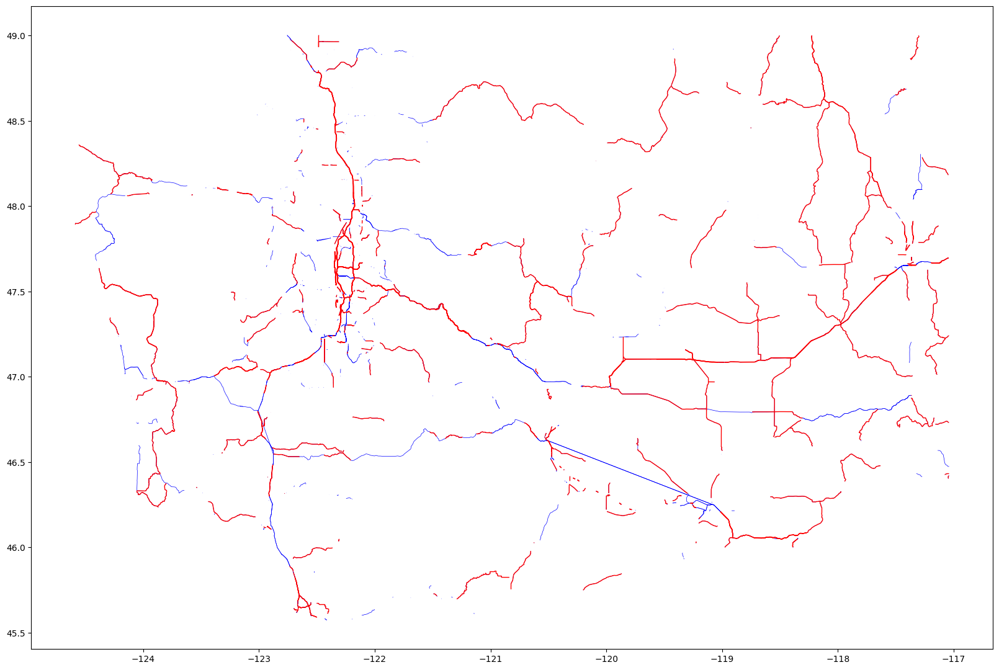

In [47]:
#Plot dig once roads over total WSDOT layer
base = Dig_Once.plot(figsize=(20,20), color='red', linewidth=1, zorder=2)
WSDOT.plot(ax=base, color='blue', linewidth=0.5, zorder=1)

In [48]:
# Export to gpkg
Dig_Once.to_file(OUTPUT / 'WSDOT_Dig_Once.gpkg')
WSDOT.to_file(OUTPUT / 'WSDOT_Total_Active.gpkg')

## Broadband service availability by zip code

In [49]:
# Demographics by zipcode
from gis_package import json
importlib.reload(json)
url = 'https://services.arcgis.com/jsIt88o09Q0r1j8h/ArcGIS/rest/services/opd_dashboard_data/FeatureServer/1/query/'

zips = json.download_feature_layer(url, 2000)
zips.head()

Downloaded 605 features...
Finished downloading 605 features


,geometry,OBJECTID,ZCTA5CE10,REPORT_NAME,GlobalID,Attachments,Shape__Area,Shape__Length
0,"POLYGON ((-122.22996 47.35376, -122.23 47.3507...",2,98001,demographics_zcta_98001.pdf,6c5a1957-21c0-4522-89ff-3b2025945ece,1,5.276145e+08,144222.382805
1,"POLYGON ((-122.20566 47.34352, -122.20567 47.3...",3,98002,demographics_zcta_98002.pdf,34da4789-6378-47dc-9f52-cbd0d6a32ff5,1,2.019560e+08,97302.710959
2,"MULTIPOLYGON (((-122.30753 47.26118, -122.3076...",4,98003,demographics_zcta_98003.pdf,196de423-5b0b-469a-843b-6d9e11eaaaf8,1,3.227508e+08,117951.404253
3,"POLYGON ((-122.2121 47.65747, -122.21215 47.65...",5,98004,demographics_zcta_98004.pdf,f15da3a7-1b7f-4228-8778-31130fdb8ef5,1,2.468110e+08,94870.902009
4,"POLYGON ((-122.15876 47.66065, -122.15844 47.6...",6,98005,demographics_zcta_98005.pdf,9e31f4f5-1dfe-4989-8963-4d8e43da14fb,1,2.048041e+08,92707.221906


In [50]:
# Convert zipcodes to integers
zips['ZCTA5CE10'] = zips['ZCTA5CE10'].astype(int)

In [51]:
# coverage by service data as of 2020
BB_zip = pd.read_csv(DATA / 'BB_2020.csv', encoding='ISO-8859-1')
BB_zip

,Zip,Population,County,State,WiredCount_2020,Fwcount_2020,AllProviderCount_2020,Wired25_3_2020,Wired100_3_2020,All25_3_2020,...,FastestAverageMbps,%Access to Terrestrial Broadband,Lowest Priced Terrestrial Broadband Plan,WiredCount_2015,Fwcount_2015,AllProviderCount_2015,Wired25_3_2015,Wired100_3_2015,All25_3_2015,All100_3.1
0,29620,12934.0,Abbeville,South Carolina,6.0,0.0,11.0,5.0,3.0,7.0,...,536.35,98%,40.00,6.0,0.0,8.0,3.0,3.0,3.0,3.0
1,29628,2759.0,Abbeville,South Carolina,4.0,0.0,8.0,3.0,2.0,5.0,...,126.06,95%,40.00,4.0,0.0,6.0,3.0,3.0,3.0,3.0
2,29638,2944.0,Abbeville,South Carolina,6.0,1.0,13.0,4.0,4.0,6.0,...,222.35,95%,40.00,5.0,0.0,7.0,2.0,2.0,2.0,2.0
3,29639,1742.0,Abbeville,South Carolina,3.0,0.0,8.0,3.0,3.0,5.0,...,223.75,90%,40.00,3.0,0.0,5.0,3.0,3.0,3.0,3.0
4,70516,1546.0,Acadia,Louisiana,4.0,3.0,12.0,2.0,2.0,4.0,...,9.41,33%,69.99,4.0,2.0,8.0,2.0,1.0,2.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32603,99781,167.0,Yukon-Koyukuk,Alaska,1.0,0.0,2.0,0.0,0.0,0.0,...,0.51,0,NaN,1.0,0.0,2.0,0.0,0.0,0.0,0.0
32604,99788,69.0,Yukon-Koyukuk,Alaska,1.0,0.0,2.0,0.0,0.0,0.0,...,NaN,0,NaN,1.0,0.0,2.0,0.0,0.0,0.0,0.0
32605,99774,78.0,Yukon-Koyukuk,Alaska,1.0,0.0,2.0,0.0,0.0,0.0,...,NaN,0,NaN,1.0,0.0,2.0,0.0,0.0,0.0,0.0
32606,99767,24.0,Yukon-Koyukuk,Alaska,0.0,0.0,1.0,0.0,0.0,0.0,...,NaN,0,NaN,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [52]:
# Spatial Join for only zipcodes within Wa State
BB_WA = zips.merge(BB_zip, how='inner', left_on='ZCTA5CE10', right_on='Zip')
BB_WA

,geometry,OBJECTID,ZCTA5CE10,REPORT_NAME,GlobalID,Attachments,Shape__Area,Shape__Length,Zip,Population,...,FastestAverageMbps,%Access to Terrestrial Broadband,Lowest Priced Terrestrial Broadband Plan,WiredCount_2015,Fwcount_2015,AllProviderCount_2015,Wired25_3_2015,Wired100_3_2015,All25_3_2015,All100_3.1
0,"POLYGON ((-122.22996 47.35376, -122.23 47.3507...",2,98001,demographics_zcta_98001.pdf,6c5a1957-21c0-4522-89ff-3b2025945ece,1,5.276145e+08,144222.382805,98001,31911.0,...,302.64,100%,65.00,4.0,0.0,5.0,2.0,2.0,2.0,2.0
1,"POLYGON ((-122.20566 47.34352, -122.20567 47.3...",3,98002,demographics_zcta_98002.pdf,34da4789-6378-47dc-9f52-cbd0d6a32ff5,1,2.019560e+08,97302.710959,98002,31647.0,...,260.82,99%,65.00,3.0,0.0,4.0,3.0,3.0,3.0,3.0
2,"MULTIPOLYGON (((-122.30753 47.26118, -122.3076...",4,98003,demographics_zcta_98003.pdf,196de423-5b0b-469a-843b-6d9e11eaaaf8,1,3.227508e+08,117951.404253,98003,44151.0,...,150.50,99%,65.00,4.0,0.0,5.0,3.0,3.0,3.0,3.0
3,"POLYGON ((-122.2121 47.65747, -122.21215 47.65...",5,98004,demographics_zcta_98004.pdf,f15da3a7-1b7f-4228-8778-31130fdb8ef5,1,2.468110e+08,94870.902009,98004,27946.0,...,299.65,100%,40.00,6.0,0.0,7.0,5.0,5.0,5.0,5.0
4,"POLYGON ((-122.15876 47.66065, -122.15844 47.6...",6,98005,demographics_zcta_98005.pdf,9e31f4f5-1dfe-4989-8963-4d8e43da14fb,1,2.048041e+08,92707.221906,98005,17714.0,...,347.66,99%,40.00,5.0,0.0,6.0,4.0,4.0,4.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
522,"POLYGON ((-118.3031 46.20869, -118.30297 46.20...",601,99362,demographics_zcta_99362.pdf,669761f2-3879-443e-a1a0-6b66561dd35e,1,7.739352e+09,691498.640974,99362,41056.0,...,108.38,100%,59.95,3.0,2.0,6.0,3.0,3.0,3.0,3.0
523,"POLYGON ((-118.2143 46.91375, -118.19416 46.91...",603,99371,demographics_zcta_99371.pdf,b3bfee88-b4e0-46bc-b698-348e1cbf43fb,1,6.038656e+09,476771.227900,99371,311.0,...,NaN,9%,85.00,4.0,1.0,6.0,0.0,0.0,1.0,1.0
524,"POLYGON ((-117.18766 45.99818, -117.18844 45.9...",604,99401,demographics_zcta_99401.pdf,b38d555f-0531-45ec-9417-533fcb3620da,1,5.169446e+09,552358.789537,99401,273.0,...,11.91,27%,66.95,1.0,0.0,2.0,0.0,0.0,0.0,0.0
525,"POLYGON ((-117.05972 46.34779, -117.05964 46.3...",605,99402,demographics_zcta_99402.pdf,ccef55f2-da73-40d1-9288-827f21993159,1,9.449045e+09,832528.987420,99402,1875.0,...,15.12,77%,55.00,2.0,1.0,4.0,2.0,1.0,2.0,1.0


<Axes: >

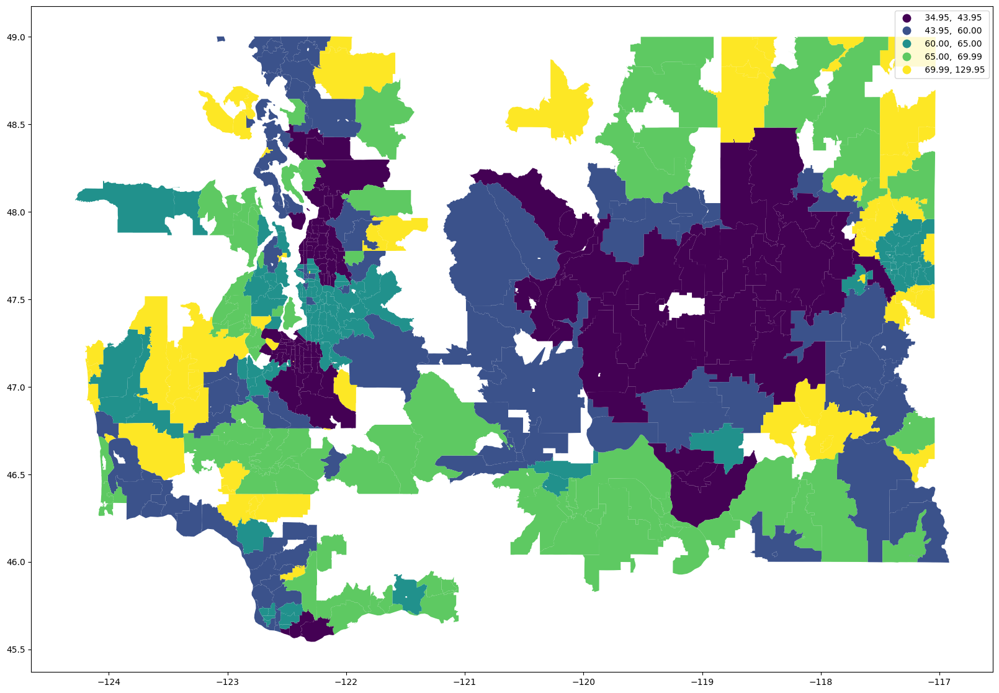

In [53]:
# Quick plot showing lowest price plan by zipcode
BB_WA.plot(column='Lowest Priced Terrestrial Broadband Plan', figsize=(20,20), scheme='quantiles', legend=True)

In [54]:
# Save to geopackage
BB_WA.to_file(OUTPUT / 'Service_Availability_WAZips.gpkg')

## Census layer with Broadband data from 2025 by census block group

In [55]:
# Washington State: state 53
state = "53"

variables = [
    "B28002_001E",  # Total households
    "B28002_004E",  # Household has broadband
    "B19013_001E",  # Median household income
    "B01001_001E",  # Total population
    "B28002_006E",  # Cell only
    "B28002_012E",  # No Sub
    "B28002_007E",  # Broadband
    "B28002_009E",  # Satellite
]

var_string = ",".join(variables)

url = (
    f"https://api.census.gov/data/2023/acs/acs5?"
    f"get=NAME,{var_string}&for=block%20group:*&in=state:{state}%20county:*"
)

resp = requests.get(url).json()
df = pd.DataFrame(resp[1:], columns=resp[0])

state_BB = df.rename(columns={
    'B28002_001E': 'total_hh', 
    'B28002_004E': 'hh_w_broadband', 
    'B19013_001E': 'hh_median_income',
    'B01001_001E': 'total_pop',
    'B28002_006E': 'cell_only',
    'B28002_012E': 'no_sub',
    'B28002_007E': 'broadband',
    'B28002_009E': 'satellite'
})
state_BB['GEOID'] = state_BB['state'] + state_BB['county'] + state_BB['tract'] + state_BB['block group']
cols = ['total_hh', 'hh_w_broadband', 'hh_median_income', 'total_pop', 'cell_only', 'no_sub', 'broadband', 'satellite']
state_BB[cols] = state_BB[cols].astype('int64')
state_BB

,NAME,total_hh,hh_w_broadband,hh_median_income,total_pop,cell_only,no_sub,broadband,satellite,state,county,tract,block group,GEOID
0,Block Group 1; Census Tract 9501; Adams County...,223,145,100536,721,11,50,67,54,53,001,950100,1,530019501001
1,Block Group 2; Census Tract 9501; Adams County...,657,555,66652,1539,92,15,394,70,53,001,950100,2,530019501002
2,Block Group 3; Census Tract 9501; Adams County...,188,164,47500,471,42,0,90,36,53,001,950100,3,530019501003
3,Block Group 1; Census Tract 9502; Adams County...,258,218,75556,658,41,0,157,19,53,001,950200,1,530019502001
4,Block Group 2; Census Tract 9502; Adams County...,150,129,74444,819,47,11,52,13,53,001,950200,2,530019502002
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5306,Block Group 1; Census Tract 9400.06; Yakima Co...,678,556,62500,2624,77,17,440,55,53,077,940006,1,530779400061
5307,Block Group 2; Census Tract 9400.06; Yakima Co...,508,427,67661,1918,107,44,306,21,53,077,940006,2,530779400062
5308,Block Group 1; Census Tract 9400.07; Yakima Co...,508,441,72667,1839,83,18,331,39,53,077,940007,1,530779400071
5309,Block Group 2; Census Tract 9400.07; Yakima Co...,469,387,44875,1665,45,0,315,37,53,077,940007,2,530779400072


<Axes: >

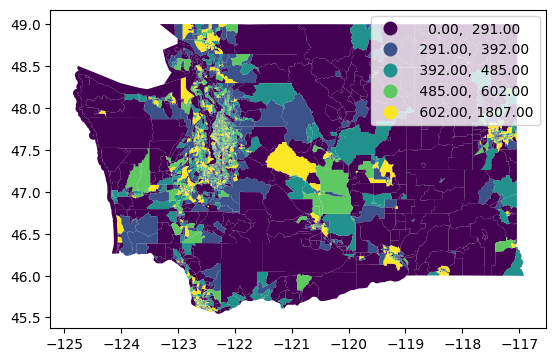

In [56]:
# import census block group Tiger/Line Shapefile and join to Broadband data

bg = gpd.read_file(DATA / 'block_group/tl_2025_53_bg.shp')
state_census = pd.merge(bg, state_BB, on='GEOID')

#Quick plot showing broadband service
state_census.plot(column='broadband', scheme='quantiles', legend=True)

In [57]:
# Output census block group data to gpkg
state_census.to_file(OUTPUT / 'State_Census_BB.gpkg')

### Service type availability from FCC data for Wa State

In [58]:
# Import all csv's of FCC data
BB_DIR = DATA / 'BB_DF'

cable = pd.read_csv(BB_DIR / 'BB_Cable.csv')
copper = pd.read_csv(BB_DIR / 'BB_Copper.csv')
fiber = pd.read_csv(BB_DIR / 'BB_Fiber.csv')
fixed_wireless = pd.read_csv(BB_DIR / 'BB_fixed_wireless.csv')
NGSO_Satellite = pd.read_csv(BB_DIR / 'BB_N_Satellite.csv')
satellite = pd.read_csv(BB_DIR / 'BB_Satellite.csv')
ul_wireless = pd.read_csv(BB_DIR / 'BB_ul_wireless.csv')
unlicensed = pd.read_csv(BB_DIR / 'BB_UL.csv')
cell_4G = gpd.read_file(BB_DIR / 'BB_4G_LTE.gpkg')
cell_5G = gpd.read_file(BB_DIR / 'BB_5G.gpkg')

In [59]:
# Create dictionary for renaming columns in dataframe
dfs_dict = {
    'cable_count': cable,
    'copper_count': copper,
    'fiber_count': fiber,
    'fixed_count': fixed_wireless,
    'NGSO_count': NGSO_Satellite,
    'satellite_count': satellite,
    'unlicensed_wireless_count': ul_wireless,
    'unlicensed_count': unlicensed
}

In [60]:
# Loop through above dictionary and 
# aggregate count of service type per
# Census block

# create variable copy of census block locations
type_join = blocks.copy()

# Convert census block GeoID to integer
type_join['GEOID20'] = type_join['GEOID20'].astype(int)

for name, df in dfs_dict.items():
    tmp = df.groupby('block_geoid').agg(
        {'technology': 'count'}
    ).reset_index()
    
    tmp.rename(columns={'technology': f'{name}'}, inplace=True)
    type_join = type_join.merge(tmp, left_on='GEOID20', right_on='block_geoid', how='outer').drop(columns=('block_geoid')).fillna(0)
    type_join[f'{name}'] = type_join[f'{name}'].astype('int64')
        
type_join

,STATEFP20,COUNTYFP20,TRACTCE20,BLOCKCE20,GEOID20,GEOIDFQ20,NAME20,MTFCC20,UR20,UACE20,...,POP20,geometry,cable_count,copper_count,fiber_count,fixed_count,NGSO_count,satellite_count,unlicensed_wireless_count,unlicensed_count
0,53,001,950100,1000,530019501001000,1000000US530019501001000,Block1000,G5040,R,0,...,11,"POLYGON ((-118.24077 47.0891, -118.24063 47.08...",0,0,0,2,6,18,0,7
1,53,001,950100,1001,530019501001001,1000000US530019501001001,Block1001,G5040,R,0,...,0,"POLYGON ((-118.02464 47.22033, -118.02399 47.2...",0,0,0,0,0,0,0,0
2,53,001,950100,1002,530019501001002,1000000US530019501001002,Block1002,G5040,R,0,...,0,"POLYGON ((-118.11566 47.22376, -118.11552 47.2...",0,0,0,1,1,3,0,2
3,53,001,950100,1003,530019501001003,1000000US530019501001003,Block1003,G5040,R,0,...,0,"POLYGON ((-117.9866 47.23529, -117.98649 47.23...",0,0,0,0,0,0,0,0
4,53,001,950100,1004,530019501001004,1000000US530019501001004,Block1004,G5040,R,0,...,0,"POLYGON ((-118.15933 47.15227, -118.15599 47.1...",0,0,0,3,3,9,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
158088,53,077,940008,1037,530779400081037,1000000US530779400081037,Block1037,G5040,U,91702,...,0,"POLYGON ((-120.43082 46.44804, -120.43041 46.4...",0,0,0,0,0,0,0,0
158089,53,077,940008,1038,530779400081038,1000000US530779400081038,Block1038,G5040,U,91702,...,20,"POLYGON ((-120.43133 46.45402, -120.43129 46.4...",2,2,0,4,2,6,2,2
158090,53,077,940008,1039,530779400081039,1000000US530779400081039,Block1039,G5040,U,91702,...,148,"POLYGON ((-120.4381 46.44835, -120.43808 46.44...",54,49,8,130,55,165,59,49
158091,53,077,940008,1040,530779400081040,1000000US530779400081040,Block1040,G5040,U,91702,...,50,"POLYGON ((-120.43805 46.45233, -120.43804 46.4...",7,7,0,14,7,21,8,3


In [61]:
# Clean up and drop unnecessary columns
type_join.drop(['STATEFP20', 'COUNTYFP20', "TRACTCE20", 'BLOCKCE20', 'GEOIDFQ20'], axis=1)

,GEOID20,NAME20,MTFCC20,UR20,UACE20,FUNCSTAT20,ALAND20,AWATER20,INTPTLAT20,INTPTLON20,...,POP20,geometry,cable_count,copper_count,fiber_count,fixed_count,NGSO_count,satellite_count,unlicensed_wireless_count,unlicensed_count
0,530019501001000,Block1000,G5040,R,0,S,126940523,512483,+47.1987312,-118.0991186,...,11,"POLYGON ((-118.24077 47.0891, -118.24063 47.08...",0,0,0,2,6,18,0,7
1,530019501001001,Block1001,G5040,R,0,S,371748,110,+47.2193127,-118.0172446,...,0,"POLYGON ((-118.02464 47.22033, -118.02399 47.2...",0,0,0,0,0,0,0,0
2,530019501001002,Block1002,G5040,R,0,S,2445833,0,+47.2345775,-118.0967808,...,0,"POLYGON ((-118.11566 47.22376, -118.11552 47.2...",0,0,0,1,1,3,0,2
3,530019501001003,Block1003,G5040,R,0,S,10407,477164,+47.2394571,-117.9765374,...,0,"POLYGON ((-117.9866 47.23529, -117.98649 47.23...",0,0,0,0,0,0,0,0
4,530019501001004,Block1004,G5040,R,0,S,13985380,0,+47.1865823,-118.1338215,...,0,"POLYGON ((-118.15933 47.15227, -118.15599 47.1...",0,0,0,3,3,9,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
158088,530779400081037,Block1037,G5040,U,91702,S,9090,0,+46.4511026,-120.4304044,...,0,"POLYGON ((-120.43082 46.44804, -120.43041 46.4...",0,0,0,0,0,0,0,0
158089,530779400081038,Block1038,G5040,U,91702,S,14660,0,+46.4540974,-120.4308829,...,20,"POLYGON ((-120.43133 46.45402, -120.43129 46.4...",2,2,0,4,2,6,2,2
158090,530779400081039,Block1039,G5040,U,91702,S,377313,0,+46.4510132,-120.4338994,...,148,"POLYGON ((-120.4381 46.44835, -120.43808 46.44...",54,49,8,130,55,165,59,49
158091,530779400081040,Block1040,G5040,U,91702,S,35525,0,+46.4527387,-120.4365469,...,50,"POLYGON ((-120.43805 46.45233, -120.43804 46.4...",7,7,0,14,7,21,8,3


<Axes: >

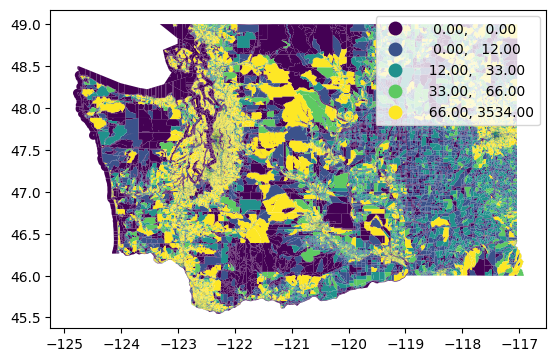

In [62]:
# quick plot showing satellite service count
type_join.plot(column='satellite_count', scheme='quantiles', legend=True)

In [63]:
# Export to gpkg
type_join.to_file(OUTPUT / 'Service_Type_WA.gpkg')